# 1. Importing

In [4]:
# Importing numpy
import numpy as np
# Importing Scipy
import scipy as sp
# Importing Pandas Library
import pandas as pd
# import glob function to scrap files path
from glob import glob
# import display() for better visualitions of DataFrames and arrays
from IPython.display import display
# import pyplot for plotting
import matplotlib.pyplot as plt
import math
from skimage.restoration import denoise_wavelet
from scipy.signal import savgol_filter
from scipy.signal import medfilt
import seaborn as sns

,Unnamed: 0,TIME_STAMP_ms,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
0,293377,765.2,4043.589744,4163.076923,4234.871795,4205.128205,4003.589744,4219.487179,4169.743590,4184.615385,4183.076923,4160.000000,4395.384615,4403.589744,4238.461538,4357.948718
1,293378,773.1,4037.435897,4150.769231,4224.615385,4218.974359,3990.769231,4212.307692,4163.589744,4169.230769,4170.769231,4152.307692,4388.205128,4402.051282,4234.871795,4352.820513
2,293379,780.9,4013.333333,4153.333333,4205.128205,4183.589744,3963.076923,4204.615385,4159.487179,4169.230769,4167.692308,4150.256410,4402.051282,4382.564103,4250.769231,4336.410256
3,293380,788.8,4011.282051,4154.871795,4203.589744,4180.000000,3964.615385,4210.256410,4165.128205,4182.051282,4165.128205,4138.974359,4400.512821,4385.128205,4242.051282,4342.051282
4,293381,796.6,4043.589744,4166.153846,4235.897436,4178.461538,3971.282051,4221.025641,4174.358974,4187.179487,4165.128205,4133.846154,4407.692308,4408.205128,4231.794872,4360.512821


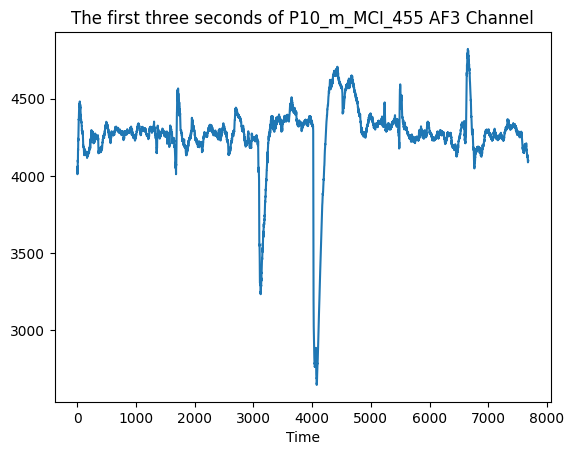

In [ ]:
d_frame=pd.read_csv('data\validation\P3_f_H_395_test1.csv',header=0)
#d_frame.drop(columns='TimeDate',inplace=True)          # converting the raw file to data frame
plt.plot(d_frame['AF3'][0:10000])           # visualizing the first 10000 values of channel ECG ECG
plt.xlabel('Time')
plt.title('The first three seconds of P10_m_MCI_455 AF3 Channel')
d_frame.head()

Text(0.5, 1.0, 'The Distribution of the EEG AF3 ')

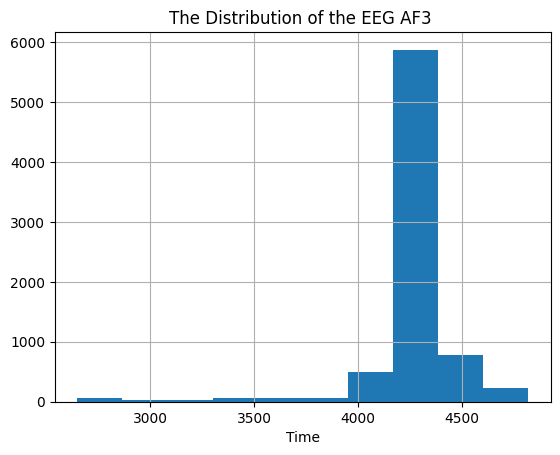

In [6]:
d_frame['AF3'].hist()
plt.xlabel('Time')
plt.title('The Distribution of the EEG AF3 ')

In [ ]:
#EEG_Raw_data_paths = sorted(glob("/content/drive/MyDrive/Basma Jalloul - D-MSDHT - Master Thesis/MCI Classification/Dataset/EEG/*"))
EEG_Raw_data_paths = sorted(glob("data\validation\EEG\*"))
HRV_Raw_data_paths = sorted(glob("data\validation\HRV\*"))

In [8]:
len(EEG_Raw_data_paths)

97

In [9]:
len(HRV_Raw_data_paths)

97

In [88]:
import re

In [86]:
def create_EEG_data_dict(Raw_data_paths):
    """
    Creates a dictionary with EEG data.
    Keys follow the format: 'subject_<state>_<id>_test<no>'
        where state is 0 for Healthy and 1 for MCI.
    """
    raw_dic = {}
    pattern = re.compile(r'_(\d+)_test(\d+)')

    for path in Raw_data_paths:
        filename = path.split('/')[-1].replace('.csv', '')
        match = re.search(pattern, filename)

        if match:
            subject_id = match.group(1)
            test_no = match.group(2)
        else:
            raise ValueError(f"Filename pattern not recognized in: {filename}")

        # Determine state from filename
        if '_H_' in filename:
            state = 0
        elif '_MCI_' in filename:
            state = 1
        else:
            raise ValueError(f"Condition not found in filename: {filename}")

        key = f"subject_{state}_{subject_id}_test{test_no}"

        df = pd.read_csv(path, header=0)
        df.drop(columns=['TIME_STAMP_ms', 'Unnamed: 0'], errors='ignore', inplace=True)
        raw_dic[key] = df

    return raw_dic
eeg_raw_dic=create_EEG_data_dict(EEG_Raw_data_paths)

In [87]:
print(eeg_raw_dic)

{'subject_1_456_test1':               AF3           F7           F3          FC5           T7  \
0     4360.000000  4336.923077  4385.128205  4366.153846  4341.538462   
1     4318.461538  4296.923077  4346.666667  4327.692308  4319.487179   
2     4268.717949  4237.948718  4287.692308  4269.230769  4268.205128   
3     4290.256410  4264.102564  4306.666667  4291.282051  4281.025641   
4     4348.205128  4321.538462  4368.717949  4352.820513  4330.769231   
...           ...          ...          ...          ...          ...   
7675  4318.461538  4299.487179  4337.948718  4342.564103  4291.794872   
7676  4304.102564  4289.743590  4322.564103  4318.974359  4276.923077   
7677  4297.948718  4284.615385  4307.692308  4302.564103  4274.358974   
7678  4313.846154  4284.102564  4320.512821  4320.000000  4285.128205   
7679  4308.717949  4269.230769  4320.512821  4318.461538  4270.769231   

               P7           O1           O2           P8           T8  \
0     4326.666667  4330.25

In [89]:
import re
import pandas as pd

def create_HRV_data_dict(Raw_data_paths):
    """
    Creates a dictionary with HRV data.
    Keys follow the format: 'subject_<state>_<id>_test<no>'
    where state = 0 (Healthy) or 1 (MCI), parsed from filename.

    Supports:
    - P5_m_MCI_397_HRV_test2.csv
    - P3_f_H_395_HRV_test1_RR.csv
    """
    raw_dic = {}
    pattern = re.compile(r'_(\d+)_HRV_test(\d+)(?:_RR)?')

    for path in Raw_data_paths:
        filename = path.split('/')[-1].replace('.csv', '')

        match = re.search(pattern, filename)
        if match:
            subject_id = match.group(1)
            test_no = match.group(2)
        else:
            raise ValueError(f"Filename pattern not recognized in: {filename}")

        # Determine condition from filename
        if '_H_' in filename:
            state = 0
        elif '_MCI_' in filename:
            state = 1
        else:
            raise ValueError(f"Condition not found in filename: {filename}")

        key = f"subject_{state}_{subject_id}_test{test_no}"

        df = pd.read_csv(path, header=0)
        df.drop(columns=['Unnamed: 0'], errors='ignore', inplace=True)

        raw_dic[key] = df

    return raw_dic

hrv_raw_dic=create_HRV_data_dict(HRV_Raw_data_paths)

In [90]:
print(hrv_raw_dic)

{'subject_1_456_test1':      HR [bpm]           RR
0          61   983.606557
1          61   983.606557
2          61   983.606557
3          61   983.606557
4          61   983.606557
..        ...          ...
595        60  1000.000000
596        60  1000.000000
597        60  1000.000000
598        60  1000.000000
599        60  1000.000000

[600 rows x 2 columns], 'subject_1_456_test2':      HR [bpm]           RR
0          60  1000.000000
1          60  1000.000000
2          60  1000.000000
3          60  1000.000000
4          60  1000.000000
..        ...          ...
725        61   983.606557
726        61   983.606557
727        61   983.606557
728        61   983.606557
729        61   983.606557

[730 rows x 2 columns], 'subject_1_456_test4':       HR [bpm]          RR
0           61  983.606557
1           61  983.606557
2           61  983.606557
3           61  983.606557
4           61  983.606557
...        ...         ...
1525        61  983.606557
1526        61  

In [91]:
# raw_dic is a dictionary contains 61 DF
print('raw_dic contains %d DataFrame' % len(eeg_raw_dic))

# print the first 3 rows of dataframe exp01_user01
eeg_raw_dic['subject_1_456_test1']

raw_dic contains 97 DataFrame


,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4
0,4360.000000,4336.923077,4385.128205,4366.153846,4341.538462,4326.666667,4330.256410,4314.871795,4111.794872,4313.333333,4553.333333,4535.897436,4398.461538,4445.641026
1,4318.461538,4296.923077,4346.666667,4327.692308,4319.487179,4306.666667,4300.512821,4274.358974,4077.435897,4266.666667,4491.794872,4476.410256,4348.717949,4395.384615
2,4268.717949,4237.948718,4287.692308,4269.230769,4268.205128,4267.692308,4252.307692,4226.666667,4033.333333,4209.743590,4420.000000,4404.615385,4285.641026,4332.307692
3,4290.256410,4264.102564,4306.666667,4291.282051,4281.025641,4280.000000,4272.307692,4254.358974,4058.461538,4238.974359,4454.358974,4440.000000,4311.794872,4361.025641
4,4348.205128,4321.538462,4368.717949,4352.820513,4330.769231,4316.410256,4326.666667,4328.205128,4122.564103,4308.205128,4539.487179,4528.717949,4386.153846,4436.923077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7675,4318.461538,4299.487179,4337.948718,4342.564103,4291.794872,4283.076923,4280.000000,4307.692308,4277.435897,4249.230769,4504.615385,4501.025641,4367.692308,4437.948718
7676,4304.102564,4289.743590,4322.564103,4318.974359,4276.923077,4262.564103,4260.000000,4282.051282,4261.538462,4224.615385,4484.102564,4472.820513,4344.615385,4417.435897
7677,4297.948718,4284.615385,4307.692308,4302.564103,4274.358974,4256.410256,4256.410256,4281.025641,4264.102564,4217.435897,4468.205128,4456.923077,4327.179487,4405.128205
7678,4313.846154,4284.102564,4320.512821,4320.000000,4285.128205,4276.923077,4278.974359,4301.025641,4285.128205,4233.846154,4485.641026,4478.974359,4338.974359,4423.076923


In [93]:
number_of_channels= eeg_raw_dic['subject_1_456_test1'].shape[1]
number_of_channels

14

In [92]:
names_of_channels=eeg_raw_dic['subject_1_456_test1'].columns
names_of_channels

Index(['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6',
       'F4', 'F8', 'AF4'],
      dtype='object')

In [94]:
# raw_dic is a dictionary contains 61 DF
print('raw_dic contains %d DataFrame' % len(hrv_raw_dic))

# print the first 3 rows of dataframe exp01_user01
hrv_raw_dic['subject_1_456_test1']

raw_dic contains 97 DataFrame


,HR [bpm],RR
0,61,983.606557
1,61,983.606557
2,61,983.606557
3,61,983.606557
4,61,983.606557
...,...,...
595,60,1000.000000
596,60,1000.000000
597,60,1000.000000
598,60,1000.000000


In [95]:
number_of_channels= hrv_raw_dic['subject_1_456_test1'].shape[1]
number_of_channels

2

In [96]:
names_of_channels=hrv_raw_dic['subject_1_456_test1'].columns
names_of_channels

Index(['HR [bpm]', 'RR'], dtype='object')

# 2. Signal Processing

In [97]:
from scipy.signal import medfilt # import the median filter function
def median(signal):# input: numpy array 1D (one column)
    array=np.array(signal)
    #applying the median filter
    med_filtered=sp.signal.medfilt(array, kernel_size=3) # applying the median filter order3(kernel_size=3)
    return  med_filtered # return the med-filtered signal: numpy array 1D

In [98]:
from scipy.signal import welch, filtfilt, butter
from scipy.signal import lfilter

fs = 128

#notch filter apllied at 50hz
def Implement_Notch_Filter(time, band, freq, ripple, order, filter_type, data):
    from scipy.signal import iirfilter
    fs   = 1/time
    nyq  = fs/2.0
    low  = freq - band/2.0
    high = freq + band/2.0
    low  = low/nyq
    high = high/nyq
    b, a = iirfilter(order, [low, high], rp=ripple, btype='bandstop',
                     analog=False, ftype=filter_type)
    filtered_data = lfilter(b, a, data)
    return filtered_data

def bandpass_filter(signal, low_freq, high_freq, fs, order=5):
    nyquist = 0.5 * fs
    low = low_freq / nyquist
    high = high_freq / nyquist
    b, a = butter(order, [low, high], btype='band')
    filtered_signal = lfilter(b, a, signal, axis=0)
    return filtered_signal

In [99]:
def SignalProcessing(raw_dic, fs=128):
    """
    Processes each signal in the raw_dic:
    - Median filter
    - Bandpass filtering (theta + beta)
    - Wavelet denoising
    - Savitzky-Golay smoothing
    """
    time_sig_dic = {}

    for key in sorted(raw_dic.keys()):
        raw_df = raw_dic[key]
        time_sig_df = pd.DataFrame()

        for column in raw_df.columns:
            t_signal = np.array(raw_df[column])
            med_filtered = median(t_signal)

            # Bandpass filter in desired range (e.g., theta or beta — not both)
            band_filtered = bandpass_filter(med_filtered, 4, 30, fs, order=2)  # or 4–8 for theta only

            # Denoising + smoothing
            wavelet_denoised = denoise_wavelet(band_filtered, method='BayesShrink', mode='hard',
                                               wavelet='sym9', wavelet_levels=5, rescale_sigma=True)
            clean_signal = savgol_filter(wavelet_denoised, 1111, 3, mode='wrap')

            time_sig_df[column] = clean_signal

        time_sig_dic[key] = time_sig_df

    return time_sig_dic

In [100]:
time_sig_dic=SignalProcessing(eeg_raw_dic)

In [101]:
time_sig_dic

{'subject_0_395_test1':            AF3        F7        F3       FC5        T7        P7        O1  \
 0    -0.103280 -0.001135 -0.103535 -0.007275 -0.090593 -0.159998 -0.064411   
 1    -0.081961  0.014870 -0.081753 -0.000301 -0.074695 -0.147472 -0.053093   
 2    -0.071738  0.018488 -0.069847  0.001586 -0.070742 -0.141189 -0.046876   
 3    -0.074751  0.012478 -0.073658 -0.000717 -0.079161 -0.145511 -0.043162   
 4    -0.080718  0.009821 -0.081234  0.002894 -0.084782 -0.152502 -0.038053   
 ...        ...       ...       ...       ...       ...       ...       ...   
 7675 -0.101059 -0.054385 -0.095938 -0.015879 -0.114577 -0.130010  0.008445   
 7676 -0.111217 -0.049365 -0.110127 -0.019115 -0.111097 -0.142220 -0.006138   
 7677 -0.119246 -0.040202 -0.122779 -0.018899 -0.114856 -0.155461 -0.034133   
 7678 -0.124259 -0.031863 -0.126876 -0.016275 -0.116223 -0.163636 -0.061909   
 7679 -0.120243 -0.019231 -0.120150 -0.012702 -0.107211 -0.166323 -0.071843   
 
             O2        P8  

In [103]:
def extract_subject_key_from_eeg_path(path):
    """
    Extracts 'subject_<state>_<id>_test<no>' from EEG file path.
    Assumes filenames like:
    - 'P11_m_H_456_test1.csv'  → subject_0_456_test1
    - 'P7_f_MCI_457_test2.csv' → subject_1_457_test2
    """
    filename = path.split('/')[-1].replace('.csv', '')

    # Extract subject ID and test number
    match = re.search(r'_(\d+)_test(\d+)', filename)
    if not match:
        raise ValueError(f"Filename format not recognized: {filename}")

    subject_id = match.group(1)
    test_no = match.group(2)

    # Determine state
    if '_H_' in filename:
        state = 0
    elif '_MCI_' in filename:
        state = 1
    else:
        raise ValueError(f"Condition (H or MCI) not found in filename: {filename}")

    return f"subject_{state}_{subject_id}_test{test_no}"

# Generate signal lengths with subject keys
subject_keys = []
time_list = []

for path in EEG_Raw_data_paths:  # or full list if needed
    key = extract_subject_key_from_eeg_path(path)
    signal_length = time_sig_dic[key].shape[0]
    subject_keys.append(key)
    time_list.append(signal_length)

# Create a DataFrame with both subject key and signal length
eeg_time_length = pd.DataFrame({
    'Subject Key': subject_keys,
    'Signal length': time_list
})


In [104]:
eeg_time_length

,Subject Key,Signal length
0,subject_1_456_test1,7680
1,subject_1_456_test2,7680
2,subject_1_456_test4,7680
3,subject_1_456_test5,7680
4,subject_1_456_test6,7680
...,...,...
92,subject_0_454_test4,7680
93,subject_0_454_test5,7680
94,subject_0_454_test6,7681
95,subject_0_454_test7,7680


In [105]:
def extract_subject_key_from_hrv_path(path):
    """
    Extracts 'subject_<state>_<id>_test<no>' from HRV file path.
    Handles:
    - '..._HRV_test1.csv'
    - '..._HRV_test1_RR.csv'
    and detects the condition from '_H_' or '_MCI_' in the filename.
    """
    filename = path.split('/')[-1].replace('.csv', '')

    # Extract subject ID and test number
    match = re.search(r'_(\d+)_HRV_test(\d+)', filename)
    if not match:
        raise ValueError(f"Filename format not recognized: {filename}")

    subject_id = match.group(1)
    test_no = match.group(2)

    # Determine state from condition
    if '_H_' in filename:
        state = 0
    elif '_MCI_' in filename:
        state = 1
    else:
        raise ValueError(f"Condition (H or MCI) not found in filename: {filename}")

    return f"subject_{state}_{subject_id}_test{test_no}"

# Compute HRV signal lengths with subject keys
hrv_keys = []
hrv_time_list = []

for path in HRV_Raw_data_paths:  # or full list if needed
    key = extract_subject_key_from_hrv_path(path)
    signal_length = hrv_raw_dic[key].shape[0]
    hrv_keys.append(key)
    hrv_time_list.append(signal_length)

# Create DataFrame with subject key and signal length
hrv_time_length = pd.DataFrame({
    'Subject Key': hrv_keys,
    'Signal length': hrv_time_list
})


In [130]:
hrv_time_length

,Subject Key,Signal length
0,subject_1_456_test1,600
1,subject_1_456_test2,730
2,subject_1_456_test4,1530
3,subject_1_456_test5,601
4,subject_1_456_test6,290
...,...,...
92,subject_0_454_test4,1900
93,subject_0_454_test5,940
94,subject_0_454_test6,680
95,subject_0_454_test7,610


# 3. Windowing

In [106]:
signal_length_lookup = {k: df.shape[0] for k, df in time_sig_dic.items()}

In [ ]:
import pandas as pd
import numpy as np
import re

def normalize5(x):
    """ Pads integer with zeros to make it 5-digit string """
    return str(x).zfill(5)

def extract_state_from_key(subject_key):
    """
    Extracts condition state (0 or 1) from the original filename in EEG_Raw_data_paths
    using a parsed subject ID and test number from the subject_key.
    """

    # Parse subject ID and test number from subject_key like: subject_0_395_test1
    match = re.search(r'subject_\d+_(\d+)_test(\d+)', subject_key)
    if not match:
        print(f"⚠️ Could not parse subject ID and test number from key: {subject_key}")
        return -1

    subject_id = match.group(1)
    test_no = match.group(2)

    # Look for matching filename
    for filename in EEG_Raw_data_paths:
        if f"_{subject_id}_test{test_no}" in filename:
            if '_H_' in filename:
                return 0
            elif '_MCI_' in filename:
                return 1
            else:
                print(f"⚠️ Condition not found in filename: {filename}")
                return -1

    print(f"⚠️ No matching filename found for: subject_{subject_id}_test{test_no}")
    return -1

def EEG_Windowing(time_sig_dic, signal_length_lookup):
    """
    Segments EEG data into 3-second windows (3840 samples, 50% overlap).
    Key format: t_Wxxxxx_subject_<state>_<id>_test<no>
    """
    Fs = 128  # sampling frequency
    win_size = 3 * Fs  # 3-second window
    step_size = win_size // 2  # 50% overlap

    window_dict = {}

    for subject_key, signal_df in time_sig_dic.items():
        if subject_key not in signal_length_lookup:
            print(f"Skipping {subject_key}, no signal length info found.")
            continue

        signal_length = signal_length_lookup[subject_key]
        state = extract_state_from_key(subject_key)
        file_key = subject_key 

        for window_ID, start in enumerate(range(0, signal_length - win_size, step_size)):
            end = start + win_size
            window_data = signal_df.iloc[start:end].to_numpy()
            window_df = pd.DataFrame(data=window_data, columns=signal_df.columns)

            key = f"t_W{normalize5(window_ID)}_{file_key}"
            window_dict[key] = window_df

    return window_dict

In [204]:
eeg_window_dict=EEG_Windowing(eeg_raw_dic, signal_length_lookup)

In [205]:
eeg_new_frames = {k:v for (k,v) in eeg_window_dict.items() if not v.empty}

In [206]:
len(eeg_new_frames)

3689

In [207]:
sorted(eeg_new_frames.keys())

['t_W00000_subject_0_395_test1',
 't_W00000_subject_0_395_test2',
 't_W00000_subject_0_395_test4',
 't_W00000_subject_0_395_test5',
 't_W00000_subject_0_395_test6',
 't_W00000_subject_0_395_test7',
 't_W00000_subject_0_395_test8',
 't_W00000_subject_0_399_test1',
 't_W00000_subject_0_399_test2',
 't_W00000_subject_0_399_test4',
 't_W00000_subject_0_399_test5',
 't_W00000_subject_0_399_test6',
 't_W00000_subject_0_399_test7',
 't_W00000_subject_0_399_test8',
 't_W00000_subject_0_454_test1',
 't_W00000_subject_0_454_test2',
 't_W00000_subject_0_454_test4',
 't_W00000_subject_0_454_test5',
 't_W00000_subject_0_454_test6',
 't_W00000_subject_0_454_test7',
 't_W00000_subject_0_454_test8',
 't_W00000_subject_0_466_test1',
 't_W00000_subject_0_466_test2',
 't_W00000_subject_0_466_test4',
 't_W00000_subject_0_466_test5',
 't_W00000_subject_0_466_test6',
 't_W00000_subject_0_466_test7',
 't_W00000_subject_0_466_test8',
 't_W00000_subject_0_468_test1',
 't_W00000_subject_0_468_test2',
 't_W00000

In [218]:
Fs_EEG = 128
eeg_win_size = 3 * Fs_EEG     # 384
eeg_step_size = eeg_win_size // 2  # 192

eeg_window_counts = {
    k: (v.shape[0] - eeg_win_size) // eeg_step_size
    for k, v in eeg_raw_dic.items()
    if (v.shape[0] - eeg_win_size) >= 0
}

In [219]:
def HRV_Windowing(time_sig_dic, signal_length_lookup, eeg_window_lookup=None, fs=10):
    win_size = 3 * fs
    step_size = win_size // 2
    window_dict = {}

    for subject_key, signal_df in time_sig_dic.items():
        if subject_key not in signal_length_lookup:
            print(f"Skipping {subject_key}, no signal length info.")
            continue

        max_len = signal_length_lookup[subject_key]
        max_windows = (
            eeg_window_lookup[subject_key]
            if eeg_window_lookup and subject_key in eeg_window_lookup
            else float('inf')
        )

        window_ID = 0
        for start in range(0, max_len - win_size, step_size):
            if window_ID >= max_windows:
                break
            end = start + win_size
            window_df = signal_df.iloc[start:end].copy()
            key = f"t_W{normalize5(window_ID)}_{subject_key}"
            window_dict[key] = window_df
            window_ID += 1

    return window_dict

In [220]:
hrv_signal_length_lookup = {
    k: df.shape[0] for k, df in hrv_raw_dic.items()
}

In [221]:
hrv_window_dict = HRV_Windowing(hrv_raw_dic, hrv_signal_length_lookup, eeg_window_counts)

In [222]:
hrv_new_frames = {k:v for (k,v) in hrv_window_dict.items() if not v.empty}

In [223]:
len(hrv_new_frames)

3489

In [224]:
hrv_new_frames

{'t_W00000_subject_1_456_test1':     HR [bpm]          RR
 0         61  983.606557
 1         61  983.606557
 2         61  983.606557
 3         61  983.606557
 4         61  983.606557
 5         61  983.606557
 6         61  983.606557
 7         61  983.606557
 8         61  983.606557
 9         61  983.606557
 10        61  983.606557
 11        61  983.606557
 12        61  983.606557
 13        61  983.606557
 14        61  983.606557
 15        61  983.606557
 16        61  983.606557
 17        61  983.606557
 18        61  983.606557
 19        61  983.606557
 20        61  983.606557
 21        61  983.606557
 22        61  983.606557
 23        61  983.606557
 24        61  983.606557
 25        61  983.606557
 26        61  983.606557
 27        61  983.606557
 28        61  983.606557
 29        61  983.606557,
 't_W00001_subject_1_456_test1':     HR [bpm]          RR
 15        61  983.606557
 16        61  983.606557
 17        61  983.606557
 18        61  983.606557

In [225]:
sorted(hrv_new_frames.keys())[0]

't_W00000_subject_0_395_test1'

In [226]:
hrv_window_dict

{'t_W00000_subject_1_456_test1':     HR [bpm]          RR
 0         61  983.606557
 1         61  983.606557
 2         61  983.606557
 3         61  983.606557
 4         61  983.606557
 5         61  983.606557
 6         61  983.606557
 7         61  983.606557
 8         61  983.606557
 9         61  983.606557
 10        61  983.606557
 11        61  983.606557
 12        61  983.606557
 13        61  983.606557
 14        61  983.606557
 15        61  983.606557
 16        61  983.606557
 17        61  983.606557
 18        61  983.606557
 19        61  983.606557
 20        61  983.606557
 21        61  983.606557
 22        61  983.606557
 23        61  983.606557
 24        61  983.606557
 25        61  983.606557
 26        61  983.606557
 27        61  983.606557
 28        61  983.606557
 29        61  983.606557,
 't_W00001_subject_1_456_test1':     HR [bpm]          RR
 15        61  983.606557
 16        61  983.606557
 17        61  983.606557
 18        61  983.606557

In [227]:
for k, df in eeg_raw_dic.items():
    print(f"{k} -> {df.shape[0]} samples")

subject_1_456_test1 -> 7680 samples
subject_1_456_test2 -> 7680 samples
subject_1_456_test4 -> 7680 samples
subject_1_456_test5 -> 7680 samples
subject_1_456_test6 -> 7680 samples
subject_1_456_test8 -> 7680 samples
subject_1_457_test1 -> 7680 samples
subject_1_457_test2 -> 7680 samples
subject_1_457_test4 -> 7680 samples
subject_1_457_test5 -> 7680 samples
subject_1_457_test6 -> 7680 samples
subject_1_457_test8 -> 7680 samples
subject_1_460_test1 -> 7680 samples
subject_1_460_test2 -> 7680 samples
subject_1_460_test4 -> 7680 samples
subject_1_460_test5 -> 7680 samples
subject_1_460_test6 -> 7680 samples
subject_1_460_test8 -> 7680 samples
subject_1_461_test1 -> 7680 samples
subject_1_461_test2 -> 7680 samples
subject_1_461_test4 -> 7680 samples
subject_1_461_test5 -> 7680 samples
subject_1_461_test6 -> 7680 samples
subject_1_461_test8 -> 7680 samples
subject_1_2_test1 -> 7680 samples
subject_1_2_test2 -> 7680 samples
subject_1_2_test4 -> 7680 samples
subject_1_2_test5 -> 7680 samples


In [133]:
for k, df in hrv_raw_dic.items():
    print(f"{k} -> {df.shape[0]} samples")

subject_1_456_test1 -> 600 samples
subject_1_456_test2 -> 730 samples
subject_1_456_test4 -> 1530 samples
subject_1_456_test5 -> 601 samples
subject_1_456_test6 -> 290 samples
subject_1_456_test8 -> 310 samples
subject_1_457_test1 -> 500 samples
subject_1_457_test2 -> 670 samples
subject_1_457_test4 -> 3350 samples
subject_1_457_test5 -> 410 samples
subject_1_457_test6 -> 550 samples
subject_1_457_test8 -> 620 samples
subject_1_460_test1 -> 600 samples
subject_1_460_test2 -> 631 samples
subject_1_460_test4 -> 2451 samples
subject_1_460_test5 -> 920 samples
subject_1_460_test6 -> 649 samples
subject_1_460_test8 -> 439 samples
subject_1_461_test1 -> 600 samples
subject_1_461_test2 -> 749 samples
subject_1_461_test4 -> 2570 samples
subject_1_461_test5 -> 610 samples
subject_1_461_test6 -> 500 samples
subject_1_461_test8 -> 1560 samples
subject_1_465_test1 -> 651 samples
subject_1_465_test2 -> 651 samples
subject_1_465_test4 -> 651 samples
subject_1_465_test5 -> 661 samples
subject_1_465_t

### Sync EEG and HRV

In [228]:
def sync_and_window_eeg_hrv(eeg_raw_dic, hrv_raw_dic, fs_eeg=128, fs_hrv=10):
    """
    Syncs EEG and HRV signals by:
    - Keeping only keys present in both
    - Removing HRV signals < 300 samples
    - Capping HRV windows to EEG count

    Returns:
    - eeg_windows: Dict of EEG windows
    - hrv_windows: Dict of HRV windows
    """

    # Step 1: Build lookup of lengths
    eeg_len_lookup = {k: v.shape[0] for k, v in eeg_raw_dic.items()}
    hrv_len_lookup = {k: v.shape[0] for k, v in hrv_raw_dic.items()}

    # Step 2: Keep only keys that exist in both AND HRV is long enough
    common_keys = [
        k for k in eeg_raw_dic
        if k in hrv_raw_dic and hrv_len_lookup[k] >= 300
    ]

    # Step 3: Define windowing parameters
    eeg_win = 3 * fs_eeg
    eeg_step = eeg_win // 2
    hrv_win = 3 * fs_hrv
    hrv_step = hrv_win // 2

    eeg_windows = {}
    hrv_windows = {}

    for key in common_keys:
        eeg_df = eeg_raw_dic[key]
        hrv_df = hrv_raw_dic[key]

        # EEG windows
        eeg_count = (eeg_df.shape[0] - eeg_win) // eeg_step
        for i, start in enumerate(range(0, eeg_df.shape[0] - eeg_win, eeg_step)):
            end = start + eeg_win
            window = eeg_df.iloc[start:end].copy()
            eeg_windows[f"t_W{normalize5(i)}_{key}"] = window

        # HRV windows (capped to same count as EEG)
        for i, start in enumerate(range(0, hrv_df.shape[0] - hrv_win, hrv_step)):
            if i >= eeg_count:
                break
            end = start + hrv_win
            window = hrv_df.iloc[start:end].copy()
            hrv_windows[f"t_W{normalize5(i)}_{key}"] = window

    return eeg_windows, hrv_windows


In [229]:
eeg_windows_synced, hrv_windows_synced = sync_and_window_eeg_hrv(eeg_raw_dic, hrv_raw_dic)

# 4. Empirical Mode Decomposition

In [231]:
import numpy as np
import pandas as pd
from PyEMD import EEMD
from tqdm import tqdm
from joblib import Parallel, delayed

########################## Config ##########################

MAX_IMFS = 8  # keep original number of IMFs
N_JOBS = -1   # use all available CPU cores

########################## EEMD Per Window ##########################

def emd_for_data_frames(t_window, max_imfs=MAX_IMFS):
    """
    Apply EEMD decomposition to all columns in a time-windowed DataFrame.
    Returns a new DataFrame where each column is an IMF from the original signal.
    """
    columns = t_window.columns.tolist()
    imfs_dict = {}

    eemd = EEMD(trials=1, parallel=True)

    for column in columns:
        t_signal = t_window[column].values
        imfs = eemd.eemd(t_signal)

        # Keep only first max_imfs IMFs (pad if fewer)
        for i in range(max_imfs):
            key = f"{column}_IMF{i+1}"
            if i < imfs.shape[0]:
                imfs_dict[key] = imfs[i]
            else:
                imfs_dict[key] = np.zeros_like(t_signal)

    return pd.DataFrame(imfs_dict)

########################## Parallelized Wrapper ##########################

def process_single_window(key, window_df, max_imfs):
    if window_df.empty:
        return key, None
    try:
        return key, emd_for_data_frames(window_df, max_imfs=max_imfs)
    except Exception as e:
        print(f"❌ Error in {key}: {e}")
        return key, None

def apply_eemd_to_window_dict_parallel(window_dict, max_imfs=MAX_IMFS, n_jobs=N_JOBS):
    """
    Applies EEMD in parallel to all EEG windows.
    Returns a dictionary of transformed IMF DataFrames.
    """
    print(f"⚙️ Applying EEMD in parallel using {n_jobs if n_jobs > 0 else 'all'} cores...")

    results = Parallel(n_jobs=n_jobs)(
        delayed(process_single_window)(key, df, max_imfs)
        for key, df in tqdm(window_dict.items())
    )

    imf_window_dict = {k: v for k, v in results if v is not None}
    return imf_window_dict

In [232]:
imf_window_dict = apply_eemd_to_window_dict_parallel(eeg_windows_synced, max_imfs=8)

⚙️ Applying EEMD in parallel using all cores...


100%|██████████| 3431/3431 [12:19:38<00:00, 12.93s/it]   


In [233]:
imf_window_dict

{'t_W00000_subject_1_456_test1':       AF3_IMF1   AF3_IMF2   AF3_IMF3   AF3_IMF4   AF3_IMF5   AF3_IMF6  \
 0     0.903768  -0.521547  -0.731651  11.162919 -13.097943 -16.445676   
 1    18.028388 -26.581676  -1.696429  12.267146 -13.693932 -16.465369   
 2   -17.105400 -23.972177  -1.425003  13.675491 -14.142211 -16.493515   
 3    14.704694   7.062886  -0.461024  15.208863 -14.434021 -16.530379   
 4   -12.341560  21.599166   0.437321  16.636287 -14.560602 -16.576225   
 ..         ...        ...        ...        ...        ...        ...   
 379   3.361848 -44.941553  12.532315  14.589686  17.586950 -25.197757   
 380  18.517014 -43.615575  11.693053  15.899378  16.716216 -24.939019   
 381   1.776420 -36.944210   9.751730  16.753206  15.977735 -24.677903   
 382 -15.886973 -28.482444   6.914294  17.178444  15.379160 -24.414416   
 383  17.495079 -21.579243   3.386693  17.204546  14.925969 -24.148566   
 
         AF3_IMF7  AF3_IMF8    F7_IMF1   F7_IMF2  ...      F8_IMF7  F8_IMF8  \

In [ ]:
import pickle

# Save the dictionary to a file
with open('data\validation\imfs_dict.pkl', 'wb') as file:
    pickle.dump(imf_window_dict, file)

In [ ]:
import pickle

# Load the dictionary from the file
with open('data\validation\imfs_dict.pkl', 'rb') as file:
    loaded_imfs_dict = pickle.load(file)

In [246]:
loaded_imfs_dict

{'t_W00000_subject_1_456_test1':       AF3_IMF1   AF3_IMF2   AF3_IMF3   AF3_IMF4   AF3_IMF5   AF3_IMF6  \
 0     0.903768  -0.521547  -0.731651  11.162919 -13.097943 -16.445676   
 1    18.028388 -26.581676  -1.696429  12.267146 -13.693932 -16.465369   
 2   -17.105400 -23.972177  -1.425003  13.675491 -14.142211 -16.493515   
 3    14.704694   7.062886  -0.461024  15.208863 -14.434021 -16.530379   
 4   -12.341560  21.599166   0.437321  16.636287 -14.560602 -16.576225   
 ..         ...        ...        ...        ...        ...        ...   
 379   3.361848 -44.941553  12.532315  14.589686  17.586950 -25.197757   
 380  18.517014 -43.615575  11.693053  15.899378  16.716216 -24.939019   
 381   1.776420 -36.944210   9.751730  16.753206  15.977735 -24.677903   
 382 -15.886973 -28.482444   6.914294  17.178444  15.379160 -24.414416   
 383  17.495079 -21.579243   3.386693  17.204546  14.925969 -24.148566   
 
         AF3_IMF7  AF3_IMF8    F7_IMF1   F7_IMF2  ...      F8_IMF7  F8_IMF8  \

# 5. Feature Extraction

In [247]:
# mean
def mean_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    mean_vector = array.mean(axis=0) # calculate the mean value of each column
    return mean_vector # return mean vetor

# std
def std_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    std_vector =array.std(axis=0) # calculate the standard deviation value of each column
    return std_vector

# mad
from statsmodels.robust import mad as median_deviation # import the median deviation function
def mad_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    mad_vector = median_deviation(array,axis=0) # calculate the median deviation value of each column
    return mad_vector

# max
def max_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    max_vector=array.max(axis=0)# calculate the max value of each column
    return max_vector

# min
def min_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    min_vector=array.min(axis=0)# calculate the min value of each column
    return min_vector

# IQR
from scipy.stats import iqr as IQR # import interquartile range function (Q3(column)-Q1(column))
def IQR_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    IQR_vector=np.apply_along_axis(IQR,0,array)# calculate the inter quartile range value of each column
    return IQR_vector

# Entropy
from scipy.stats import entropy # import the entropy function
def entropy_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    entropy_vector=np.apply_along_axis(entropy,0,abs(array))# calculate the entropy value of each column
    return entropy_vector

def rmssd(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    rmssd = np.sqrt(np.mean(df)**2)
    return rmssd

In [249]:
imf_counts = {}

for key, df in loaded_imfs_dict.items():
    imf_count = {}

    for col in df.columns:
        if '_IMF' in col:
            channel, imf = col.split('_IMF')
            if channel not in imf_count:
                imf_count[channel] = set()
            imf_count[channel].add(imf)

    imf_counts[key] = {channel: len(imfs) for channel, imfs in imf_count.items()}

# Print results
for key, counts in imf_counts.items():
    print(f"{key}: {counts}")

t_W00000_subject_1_456_test1: {'AF3': 8, 'F7': 8, 'F3': 8, 'FC5': 8, 'T7': 8, 'P7': 8, 'O1': 8, 'O2': 8, 'P8': 8, 'T8': 8, 'FC6': 8, 'F4': 8, 'F8': 8, 'AF4': 8}
t_W00001_subject_1_456_test1: {'AF3': 8, 'F7': 8, 'F3': 8, 'FC5': 8, 'T7': 8, 'P7': 8, 'O1': 8, 'O2': 8, 'P8': 8, 'T8': 8, 'FC6': 8, 'F4': 8, 'F8': 8, 'AF4': 8}
t_W00002_subject_1_456_test1: {'AF3': 8, 'F7': 8, 'F3': 8, 'FC5': 8, 'T7': 8, 'P7': 8, 'O1': 8, 'O2': 8, 'P8': 8, 'T8': 8, 'FC6': 8, 'F4': 8, 'F8': 8, 'AF4': 8}
t_W00003_subject_1_456_test1: {'AF3': 8, 'F7': 8, 'F3': 8, 'FC5': 8, 'T7': 8, 'P7': 8, 'O1': 8, 'O2': 8, 'P8': 8, 'T8': 8, 'FC6': 8, 'F4': 8, 'F8': 8, 'AF4': 8}
t_W00004_subject_1_456_test1: {'AF3': 8, 'F7': 8, 'F3': 8, 'FC5': 8, 'T7': 8, 'P7': 8, 'O1': 8, 'O2': 8, 'P8': 8, 'T8': 8, 'FC6': 8, 'F4': 8, 'F8': 8, 'AF4': 8}
t_W00005_subject_1_456_test1: {'AF3': 8, 'F7': 8, 'F3': 8, 'FC5': 8, 'T7': 8, 'P7': 8, 'O1': 8, 'O2': 8, 'P8': 8, 'T8': 8, 'FC6': 8, 'F4': 8, 'F8': 8, 'AF4': 8}
t_W00006_subject_1_456_test1: {'AF

In [250]:
filtered_imfs_dict = loaded_imfs_dict

In [251]:
filtered_imfs_dict

{'t_W00000_subject_1_456_test1':       AF3_IMF1   AF3_IMF2   AF3_IMF3   AF3_IMF4   AF3_IMF5   AF3_IMF6  \
 0     0.903768  -0.521547  -0.731651  11.162919 -13.097943 -16.445676   
 1    18.028388 -26.581676  -1.696429  12.267146 -13.693932 -16.465369   
 2   -17.105400 -23.972177  -1.425003  13.675491 -14.142211 -16.493515   
 3    14.704694   7.062886  -0.461024  15.208863 -14.434021 -16.530379   
 4   -12.341560  21.599166   0.437321  16.636287 -14.560602 -16.576225   
 ..         ...        ...        ...        ...        ...        ...   
 379   3.361848 -44.941553  12.532315  14.589686  17.586950 -25.197757   
 380  18.517014 -43.615575  11.693053  15.899378  16.716216 -24.939019   
 381   1.776420 -36.944210   9.751730  16.753206  15.977735 -24.677903   
 382 -15.886973 -28.482444   6.914294  17.178444  15.379160 -24.414416   
 383  17.495079 -21.579243   3.386693  17.204546  14.925969 -24.148566   
 
         AF3_IMF7  AF3_IMF8    F7_IMF1   F7_IMF2  ...      F8_IMF7  F8_IMF8  \

In [ ]:
# Energy calculation for each IMF component of each EEG channel
def t_energy_axial(df):
    energy_vector = (df**2).sum(axis=0) / len(df)
    return energy_vector

# Time Features Pipeline adapted for IMF components
def t_axial_features_generation(t_window, expected_imfs=8):
    """
    Extracts mean, std, max, min, and energy from each IMF of each channel.
    Pads with zeros if IMF is missing.
    """
    t_axial_features = []
    channels = [col.split('_')[0] for col in t_window.columns if '_IMF' in col]
    unique_channels = sorted(set(channels))  # Sorting ensures consistent feature order

    for channel in unique_channels:
        for i in range(1, expected_imfs + 1):
            imf_column = f'{channel}_IMF{i}'
            if imf_column in t_window.columns:
                data = t_window[imf_column]
            else:
                data = pd.Series([0] * len(t_window))  # Pad with zeros if IMF is missing

            # Extract features
            t_axial_features.extend([
                data.mean(),
                data.std(),
                data.max(),
                data.min(),
                (data**2).sum() / len(data)  # energy
            ])

    return t_axial_features

# Generating feature names for the dataset
def time_features_names(channels, num_imfs_per_channel=8):
    """
    Generates column names for all time-domain features extracted from IMF components.
    Each IMF per channel will have mean, std, max, min, energy.
    """
    feature_names = []
    for channel in channels:
        for imf_num in range(1, num_imfs_per_channel + 1):
            imf = f"IMF{imf_num}"
            for feature in ['mean', 'std', 'max', 'min', 'energy']:
                feature_names.append(f"{channel}_{imf}_{feature}")
    return feature_names


channels = ["AF3","F7","F3","FC5","T7","P7","O1","O2","P8","T8","FC6","F4","F8","AF4"]

feature_names = time_features_names(num_imfs_per_channel=8, channels=channels)

print(feature_names)

time_columns = time_features_names(num_imfs_per_channel=8, channels=channels) + ['HRV', 'Max HRV', 'Min HRV', 'RR', 'Min RR', 'Max RR', 'SDRR', 'RMSSD', 'state', 'subject']

['AF3_IMF1_mean', 'AF3_IMF1_std', 'AF3_IMF1_max', 'AF3_IMF1_min', 'AF3_IMF1_energy', 'AF3_IMF2_mean', 'AF3_IMF2_std', 'AF3_IMF2_max', 'AF3_IMF2_min', 'AF3_IMF2_energy', 'AF3_IMF3_mean', 'AF3_IMF3_std', 'AF3_IMF3_max', 'AF3_IMF3_min', 'AF3_IMF3_energy', 'AF3_IMF4_mean', 'AF3_IMF4_std', 'AF3_IMF4_max', 'AF3_IMF4_min', 'AF3_IMF4_energy', 'AF3_IMF5_mean', 'AF3_IMF5_std', 'AF3_IMF5_max', 'AF3_IMF5_min', 'AF3_IMF5_energy', 'AF3_IMF6_mean', 'AF3_IMF6_std', 'AF3_IMF6_max', 'AF3_IMF6_min', 'AF3_IMF6_energy', 'AF3_IMF7_mean', 'AF3_IMF7_std', 'AF3_IMF7_max', 'AF3_IMF7_min', 'AF3_IMF7_energy', 'AF3_IMF8_mean', 'AF3_IMF8_std', 'AF3_IMF8_max', 'AF3_IMF8_min', 'AF3_IMF8_energy', 'F7_IMF1_mean', 'F7_IMF1_std', 'F7_IMF1_max', 'F7_IMF1_min', 'F7_IMF1_energy', 'F7_IMF2_mean', 'F7_IMF2_std', 'F7_IMF2_max', 'F7_IMF2_min', 'F7_IMF2_energy', 'F7_IMF3_mean', 'F7_IMF3_std', 'F7_IMF3_max', 'F7_IMF3_min', 'F7_IMF3_energy', 'F7_IMF4_mean', 'F7_IMF4_std', 'F7_IMF4_max', 'F7_IMF4_min', 'F7_IMF4_energy', 'F7_IMF5_me

In [259]:
import re

def Dataset_Generation_PipeLine(t_dic, hrv_dic, time_columns):
    """
    Builds the full dataset from:
    - t_dic: dict of IMF-transformed EEG windows
    - hrv_dic: dict of HRV windows
    - time_columns: ordered list of final column names

    Returns:
    - final_Dataset: pd.DataFrame of features
    """
    final_Dataset = pd.DataFrame(columns=time_columns)

    for key, t_window in t_dic.items():
        if key not in hrv_dic:
            continue  # Skip if there's no corresponding HRV window

        h_window = hrv_dic[key]

        # Extract subject and trial ID from key
        match = re.search(r'subject_(\d+)_(\d+)_test(\d+)', key)
        if not match:
            print(f"⚠️ Key format not recognized: {key}")
            continue

        window_activity_id = int(match.group(1))  # state (0 or 1)
        window_user_id = int(match.group(2))      # subject ID

        # Generate time-domain EEG features
        time_features = t_axial_features_generation(t_window)

        # Generate HRV features
        hrv_features = [
            round(mean_axial(h_window['HR [bpm]'])),
            max_axial(h_window['HR [bpm]']),
            min_axial(h_window['HR [bpm]']),
            mean_axial(h_window['RR']),
            max_axial(h_window['RR']),
            min_axial(h_window['RR']),
            mad_axial(h_window['RR']),
            rmssd(h_window['RR']),
        ]

        # Combine all into one row
        row = time_features + hrv_features + [window_activity_id, window_user_id]

        if len(row) != len(time_columns):
            print(f"❌ Column mismatch for {key}: expected {len(time_columns)}, got {len(row)}")
            continue

        final_Dataset.loc[len(final_Dataset)] = row

    return final_Dataset

In [260]:
channels = sorted(set(col.split('_')[0] for col in imf_window_dict[list(imf_window_dict.keys())[0]].columns))
time_columns = time_features_names(channels, num_imfs_per_channel=8) + [
    'HRV', 'Max HRV', 'Min HRV', 'RR', 'Min RR', 'Max RR', 'SDRR', 'RMSSD', 'state', 'subject'
]

In [261]:
Dataset = Dataset_Generation_PipeLine(filtered_imfs_dict,hrv_new_frames,time_columns)

In [262]:
display(Dataset.head(10)) # the first ten rows

,AF3_IMF1_mean,AF3_IMF1_std,AF3_IMF1_max,AF3_IMF1_min,AF3_IMF1_energy,AF3_IMF2_mean,AF3_IMF2_std,AF3_IMF2_max,AF3_IMF2_min,AF3_IMF2_energy,...,HRV,Max HRV,Min HRV,RR,Min RR,Max RR,SDRR,RMSSD,state,subject
0,1.579954,31.522413,96.169394,-86.586936,993.571136,0.427793,21.527522,111.790150,-60.290003,462.410334,...,61.0,61.0,61.0,983.606557,983.606557,983.606557,0.0,983.606557,1.0,456.0
1,-0.253365,27.534165,81.888794,-81.680513,756.220129,-0.137249,19.762973,63.318206,-61.070916,389.576802,...,61.0,61.0,61.0,983.606557,983.606557,983.606557,0.0,983.606557,1.0,456.0
2,-1.762768,29.094407,82.226656,-99.965690,847.387463,0.070769,19.421113,64.689947,-57.322252,376.202395,...,61.0,61.0,60.0,987.978142,1000.000000,983.606557,0.0,987.978142,1.0,456.0
3,0.094471,24.319248,77.807892,-70.180567,589.894600,-0.094031,18.896392,46.972998,-42.477790,356.152603,...,60.0,61.0,60.0,996.174863,1000.000000,983.606557,0.0,996.174863,1.0,456.0
4,-0.118249,23.340130,75.355099,-65.116020,543.356986,0.575731,15.265007,39.324196,-44.243896,232.745092,...,60.0,60.0,60.0,1000.000000,1000.000000,1000.000000,0.0,1000.000000,1.0,456.0
5,0.065258,23.335657,73.296795,-75.330321,543.139042,0.172570,16.134904,54.204612,-59.114406,259.686948,...,60.0,60.0,59.0,1007.344633,1016.949153,1000.000000,0.0,1007.344633,1.0,456.0
6,0.492124,25.837355,79.904272,-79.202587,666.072629,-0.611716,14.337341,39.130329,-41.397869,205.398242,...,59.0,60.0,59.0,1015.819209,1016.949153,1000.000000,0.0,1015.819209,1.0,456.0
7,-0.008160,157.429475,378.098925,-361.709652,24719.497775,0.222357,69.777563,184.798109,-184.355568,4856.278301,...,59.0,59.0,59.0,1016.949153,1016.949153,1016.949153,0.0,1016.949153,1.0,456.0
8,-0.226805,172.827844,425.446759,-388.867440,29791.729875,-3.535429,104.266925,263.180240,-307.878917,10855.779496,...,59.0,59.0,59.0,1016.949153,1016.949153,1016.949153,0.0,1016.949153,1.0,456.0
9,-0.210056,65.142793,157.982687,-147.965073,4232.576659,-0.691160,33.186445,96.586325,-84.837473,1098.949782,...,59.0,60.0,59.0,1015.254237,1016.949153,1000.000000,0.0,1015.254237,1.0,456.0


In [ ]:
Dataset.to_csv('data\validation\eeg_hrv_dataset_3s.csv', index=False)

# 6. Feature Selection

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
import pandas as pd

Dataset = pd.read_csv('data\validation\eeg_hrv_dataset_3s.csv')

X = Dataset.drop(['state','subject'], axis = 1)
Y = Dataset['state']
X = pd.get_dummies(X, prefix_sep='_')

In [265]:
X

,AF3_IMF1_mean,AF3_IMF1_std,AF3_IMF1_max,AF3_IMF1_min,AF3_IMF1_energy,AF3_IMF2_mean,AF3_IMF2_std,AF3_IMF2_max,AF3_IMF2_min,AF3_IMF2_energy,...,T8_IMF8_min,T8_IMF8_energy,HRV,Max HRV,Min HRV,RR,Min RR,Max RR,SDRR,RMSSD
0,1.579954,31.522413,96.169394,-86.586936,993.571136,0.427793,21.527522,111.790150,-60.290003,462.410334,...,0.0,0.0,61.0,61.0,61.0,983.606557,983.606557,983.606557,0.0,983.606557
1,-0.253365,27.534165,81.888794,-81.680513,756.220129,-0.137249,19.762973,63.318206,-61.070916,389.576802,...,0.0,0.0,61.0,61.0,61.0,983.606557,983.606557,983.606557,0.0,983.606557
2,-1.762768,29.094407,82.226656,-99.965690,847.387463,0.070769,19.421113,64.689947,-57.322252,376.202395,...,0.0,0.0,61.0,61.0,60.0,987.978142,1000.000000,983.606557,0.0,987.978142
3,0.094471,24.319248,77.807892,-70.180567,589.894600,-0.094031,18.896392,46.972998,-42.477790,356.152603,...,0.0,0.0,60.0,61.0,60.0,996.174863,1000.000000,983.606557,0.0,996.174863
4,-0.118249,23.340130,75.355099,-65.116020,543.356986,0.575731,15.265007,39.324196,-44.243896,232.745092,...,0.0,0.0,60.0,60.0,60.0,1000.000000,1000.000000,1000.000000,0.0,1000.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3230,1.329288,78.386195,247.197417,-216.955542,6130.161503,-1.356445,42.749667,127.339342,-144.689474,1824.614731,...,0.0,0.0,85.0,86.0,85.0,703.693570,705.882353,697.674419,0.0,703.693570
3231,-1.226884,101.917145,287.865870,-281.176154,10361.559880,3.149059,73.112734,242.707843,-207.572567,5341.468003,...,0.0,0.0,85.0,85.0,85.0,705.882353,705.882353,705.882353,0.0,705.882353
3232,-6.668926,167.222081,438.593434,-501.939344,27934.878200,1.131986,107.667847,341.815422,-310.287707,11563.458286,...,0.0,0.0,85.0,85.0,84.0,706.442577,714.285714,705.882353,0.0,706.442577
3233,-1.377093,159.211248,410.388497,-403.819040,25284.106992,3.805539,103.736082,368.082322,-272.614384,10747.632944,...,0.0,0.0,84.0,85.0,84.0,710.644258,714.285714,705.882353,0.0,710.644258


In [266]:
Y

0       1.0
1       1.0
2       1.0
3       1.0
4       1.0
       ... 
3230    0.0
3231    0.0
3232    0.0
3233    0.0
3234    0.0
Name: state, Length: 3235, dtype: float64

In [267]:
Y = LabelEncoder().fit_transform(Y)
X = StandardScaler().fit_transform(X)

In [268]:
from sklearn.model_selection import train_test_split

# Split into training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [269]:
# Further split the training set into training and validation sets
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.25, random_state=42)

In [270]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold

# X_train and Y_train are already defined as feature set and labels
estimator = RandomForestClassifier(n_estimators=100, random_state=42)
cv = StratifiedKFold(5)
selector = RFECV(estimator, step=1, cv=cv, scoring='accuracy')
selector = selector.fit(X_train, Y_train)

optimal_feature_count = selector.n_features_
selected_features_mask = selector.support_
selected_features_indices = np.where(selected_features_mask)[0]

print(f'Optimal number of features: {optimal_feature_count}')
print(f'Selected features indices: {selected_features_indices}')

Optimal number of features: 43
Selected features indices: [  1   4   9  13  44  51  52  81  84  97 121 161 162 164 166 169 241 244
 246 249 342 361 401 402 403 404 446 449 463 481 484 501 521 522 524 529
 560 561 562 563 564 565 567]


In [271]:
# After fitting the selector
feature_ranking = selector.ranking_

# Get the indices of the selected features
selected_indices = np.where(feature_ranking == 1)[0]

# Now you can use the selected indices to understand which features were considered important
selected_feature_names = [time_columns[i] for i in selected_indices]

print("Selected features:", selected_feature_names)

Selected features: ['AF3_IMF1_std', 'AF3_IMF1_energy', 'AF3_IMF2_energy', 'AF3_IMF3_min', 'AF4_IMF1_energy', 'AF4_IMF3_std', 'AF4_IMF3_max', 'F3_IMF1_std', 'F3_IMF1_energy', 'F3_IMF4_max', 'F4_IMF1_std', 'F7_IMF1_std', 'F7_IMF1_max', 'F7_IMF1_energy', 'F7_IMF2_std', 'F7_IMF2_energy', 'FC5_IMF1_std', 'FC5_IMF1_energy', 'FC5_IMF2_std', 'FC5_IMF2_energy', 'O1_IMF5_max', 'O2_IMF1_std', 'P7_IMF1_std', 'P7_IMF1_max', 'P7_IMF1_min', 'P7_IMF1_energy', 'P8_IMF2_std', 'P8_IMF2_energy', 'P8_IMF5_min', 'T7_IMF1_std', 'T7_IMF1_energy', 'T7_IMF5_std', 'T8_IMF1_std', 'T8_IMF1_max', 'T8_IMF1_energy', 'T8_IMF2_energy', 'HRV', 'Max HRV', 'Min HRV', 'RR', 'Min RR', 'Max RR', 'RMSSD']


In [ ]:
import joblib

# Save the trained RFECV selector
joblib.dump(selector, 'data\validation\rfecv_selector_selected_features_3s.joblib')

['Bernard/rfecv_selector_selected_features_3s.joblib']

In [ ]:
import joblib
import numpy as np

# Load the previously trained RFECV selector
selector = joblib.load('data\validation\rfecv_selector_selected_features_3s.joblib')

# You can now use the selector for feature selection or to check selected features
selected_features_mask = selector.support_
selected_features_indices = np.where(selected_features_mask)[0]

print(f'Selected features indices: {selected_features_indices}')


Selected features indices: [  1   4   9  13  44  51  52  81  84  97 121 161 162 164 166 169 241 244
 246 249 342 361 401 402 403 404 446 449 463 481 484 501 521 522 524 529
 560 561 562 563 564 565 567]


In [274]:
selector.ranking_  # Array with 1 = best, higher = less useful

array([356,   1,  41,  83,   1, 368,  21,  73, 110,   1, 282,  61,  44,
         1,  31, 352, 224, 191, 179, 219, 392,  67,  54, 204,   6, 311,
       146, 297, 299, 402, 454, 415, 444, 430, 414, 514, 516, 517, 522,
       520, 240,  72, 171, 106,   1, 214,  64,  56, 138,  39, 265,   1,
         1, 157,  15, 353, 280, 226, 267, 249, 331, 152, 410, 218, 217,
       121, 322, 319, 261, 198, 337, 440, 260, 270, 342, 461, 439, 501,
       509, 459, 384,   1,  16,   5,   1, 382,  46, 144,  79,  35, 235,
        32, 136, 215,  82, 406,   2,   1,  51,  36, 340,  26,  55, 197,
        89, 263, 296, 363, 236, 375, 431, 453, 424, 436, 385, 492, 502,
       482, 480, 477, 351,   1,  50,  37,   7, 336,  98, 232, 130, 109,
       307, 153, 205,  63, 123, 355, 294, 361, 332, 216, 309, 293, 250,
       334, 335, 264, 321, 200, 310, 403, 394, 445, 416, 411, 449, 486,
       467, 472, 462, 466, 390,   1,   1,   8,   1, 255,   1,  19,  11,
         1, 259,  22,  71,  85,  34, 400, 102, 147, 253, 128, 37

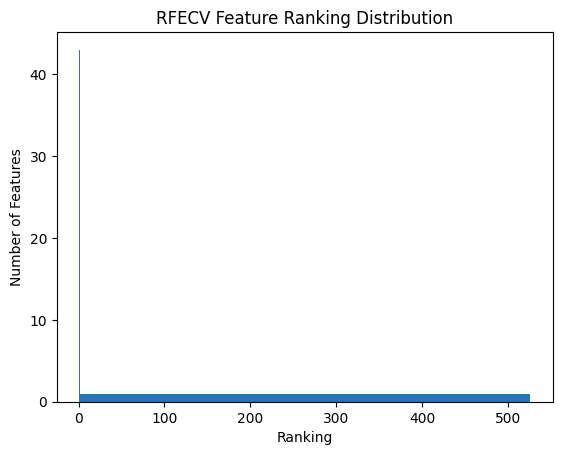

In [275]:
import matplotlib.pyplot as plt

rankings = selector.ranking_

plt.hist(rankings, bins=np.max(rankings))
plt.title("RFECV Feature Ranking Distribution")
plt.xlabel("Ranking")
plt.ylabel("Number of Features")
plt.show()

In [276]:
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

eeg_feature_count = 35
hrv_feature_count = 8

# EEG features
X_train_eeg_transformed = X_train_selected[:, :eeg_feature_count]
X_test_eeg_transformed = X_test_selected[:, :eeg_feature_count]

# HRV features
X_train_hrv = X_train_selected[:, eeg_feature_count:eeg_feature_count + hrv_feature_count]
X_test_hrv = X_test_selected[:, eeg_feature_count:eeg_feature_count + hrv_feature_count]

In [277]:
X_test_hrv.shape

(647, 8)

In [278]:
X_train_hrv_reshaped = X_train_hrv.reshape(-1, 1, 8)
X_test_hrv_reshaped = X_test_hrv.reshape(-1, 1, 8)

# 7. K-Fold Average Cross Validation

### EEG + HRV

In [296]:
from sklearn.model_selection import StratifiedKFold
from keras import backend as K
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
import numpy as np

# Set up K-Fold cross-validation
n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Storage
all_train_acc_hybrid, all_val_acc_hybrid = [], []
all_train_loss_hybrid, all_val_loss_hybrid = [], []
all_y_true_hybrid, all_y_pred_hybrid = [], []

fold_no = 1

for train_idx, test_idx in skf.split(np.zeros(len(Y_train)), Y_train):
    print(f"Training fold {fold_no}...")

    # Regularization strength
    l2_reg = 0.002

    # Prepare inputs
    eeg_train, eeg_test = X_train_eeg_transformed[train_idx], X_train_eeg_transformed[test_idx]
    hrv_train, hrv_test = X_train_hrv_reshaped[train_idx], X_train_hrv_reshaped[test_idx]
    y_train_fold, y_test_fold = Y_train[train_idx], Y_train[test_idx]

    # EEG Branch
    input_eeg = Input(shape=(X_train_eeg_transformed.shape[1], 1))
    eeg_branch = Conv1D(filters=32, kernel_size=2, activation='relu', kernel_regularizer=l2(l2_reg))(input_eeg)
    eeg_branch = MaxPooling1D(pool_size=2)(eeg_branch)
    eeg_branch = Conv1D(filters=32, kernel_size=2, activation='relu', kernel_regularizer=l2(l2_reg))(eeg_branch)
    eeg_branch = MaxPooling1D(pool_size=2)(eeg_branch)
    eeg_branch = LSTM(32, return_sequences=True, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(l2_reg))(eeg_branch)
    eeg_branch = Flatten()(eeg_branch)

    # HRV Branch
    input_hrv = Input(shape=(1, X_train_hrv_reshaped.shape[2]))
    hrv_branch = LSTM(32, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(l2_reg))(input_hrv)
    hrv_branch = LayerNormalization()(hrv_branch)

    # Cross-Attention
    eeg_exp = Reshape((1, -1))(eeg_branch)
    hrv_exp = Reshape((1, -1))(hrv_branch)
    cross_attention = MultiHeadAttention(num_heads=4, key_dim=32, kernel_regularizer=l2(l2_reg))(eeg_exp, hrv_exp, hrv_exp)
    cross_attention = Flatten()(cross_attention)

    # Fusion and Dense Layers
    merged = concatenate([eeg_branch, hrv_branch, cross_attention])
    merged = Dense(64, activation='relu', kernel_regularizer=l2(l2_reg))(merged)
    merged = BatchNormalization()(merged)
    merged = Dropout(0.2)(merged)

    # Output Layer
    output = Dense(1, activation='sigmoid')(merged)

    # Define Model
    model_hybrid_k_fold = Model(inputs=[input_eeg, input_hrv], outputs=output)

    # Compile with optimizer (gradient clipping to improve stability)
    optimizer = Adam(learning_rate=1e-3, clipvalue=1.0)
    model_hybrid_k_fold.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5)

    history_hybrid_k_fold = model_hybrid_k_fold.fit(
        [eeg_train, hrv_train],
        y_train_fold,
        validation_data=([eeg_test, hrv_test], y_test_fold),
        epochs=100,
        batch_size=36,
        verbose=1,
        callbacks=[early_stopping, lr_scheduler]
    )

    # Store history per epoch
    all_train_acc_hybrid.append(history_hybrid_k_fold.history['accuracy'])
    all_val_acc_hybrid.append(history_hybrid_k_fold.history['val_accuracy'])
    all_train_loss_hybrid.append(history_hybrid_k_fold.history['loss'])
    all_val_loss_hybrid.append(history_hybrid_k_fold.history['val_loss'])

    # Predictions
    preds = (model_hybrid_k_fold.predict([eeg_test, hrv_test]) > 0.5).astype(int)
    all_y_pred_hybrid.extend(preds.flatten())
    all_y_true_hybrid.extend(y_test_fold)

    fold_no += 1
    K.clear_session()

Training fold 1...
Epoch 1/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - accuracy: 0.5911 - loss: 1.2657 - val_accuracy: 0.6923 - val_loss: 1.0897 - learning_rate: 0.0010
Epoch 2/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6274 - loss: 1.0782 - val_accuracy: 0.7231 - val_loss: 0.9778 - learning_rate: 0.0010
Epoch 3/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6834 - loss: 0.9530 - val_accuracy: 0.7077 - val_loss: 0.8934 - learning_rate: 0.0010
Epoch 4/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7277 - loss: 0.8407 - val_accuracy: 0.7333 - val_loss: 0.8422 - learning_rate: 0.0010
Epoch 5/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7200 - loss: 0.8086 - val_accuracy: 0.7077 - val_loss: 0.7929 - learning_rate: 0.0010
Epoch 6/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7401 - loss: 0.7567 - val_accuracy: 0.7077 - val_loss: 0.7501 - learning_rate: 0.0010
Epoch 7/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.713

In [ ]:
history_hybrid_k_fold.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 35, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_6 (Conv1D)   │ (None, 34, 32)    │         96 │ input_layer_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_6     │ (None, 17, 32)    │          0 │ conv1d_6[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_7 (Conv1D)   │ (None, 16, 32)    │      2,080 │ max_pooling1d_6[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_7     │ (None, 8, 32)     │          0 │ conv1d_7[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_7       │ (None, 1, 8)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_8 (LSTM)       │ (None, 8, 32)     │      8,320 │ max_pooling1d_7[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_9 (LSTM)       │ (None, 32)        │      5,248 │ input_layer_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_4 (Flatten) │ (None, 256)       │          0 │ lstm_8[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 32)        │         64 │ lstm_9[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_2 (Reshape) │ (None, 1, 256)    │          0 │ flatten_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_3 (Reshape) │ (None, 1, 32)     │          0 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 1, 256)    │     74,368 │ reshape_2[0][0],  │
│ (MultiHeadAttentio… │                   │            │ reshape_3[0][0],  │
│                     │                   │            │ reshape_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_5 (Flatten) │ (None, 256)       │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 544)       │          0 │ flatten_4[0][0],  │
│ (Concatenate)       │                   │            │ layer_normalizat… │
│                     │                   │            │ flatten_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 64)        │     34,880 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_6[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 64)        │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 1)         │         65 │ dropout_7[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 125,377 (489.75 KB)

 Trainable params: 125,249 (489.25 KB)

 Non-trainable params: 128 (512.00 B)

In [299]:
# Compute mean curves
min_len_hybrid = min(len(hist) for hist in all_train_acc_hybrid)
avg_train_acc_hybrid = np.mean([a[:min_len_hybrid] for a in all_train_acc_hybrid], axis=0)
avg_val_acc_hybrid = np.mean([a[:min_len_hybrid] for a in all_val_acc_hybrid], axis=0)
avg_train_loss_hybrid = np.mean([a[:min_len_hybrid] for a in all_train_loss_hybrid], axis=0)
avg_val_loss_hybrid = np.mean([a[:min_len_hybrid] for a in all_val_loss_hybrid], axis=0)

In [300]:
# Print final summary
print(f"Average Validation Accuracy: {np.mean(avg_train_acc_hybrid[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_train_acc_hybrid[-10:]) * 100:.2f}%")

print(f"Average Validation Accuracy: {np.mean(avg_val_acc_hybrid[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_val_acc_hybrid[-10:]) * 100:.2f}%")

Average Validation Accuracy: 94.35%
Standard Validation Accuracy Deviation (last 10 epochs): 0.26%
Average Validation Accuracy: 94.09%
Standard Validation Accuracy Deviation (last 10 epochs): 0.32%


In [297]:
# Try classification report again
from sklearn.metrics import classification_report
print(classification_report(all_y_true_hybrid, all_y_pred_hybrid, target_names=["Healthy", "MCI"]))

              precision    recall  f1-score   support

     Healthy       0.94      0.96      0.95      1084
         MCI       0.95      0.93      0.94       857

    accuracy                           0.95      1941
   macro avg       0.95      0.95      0.95      1941
weighted avg       0.95      0.95      0.95      1941



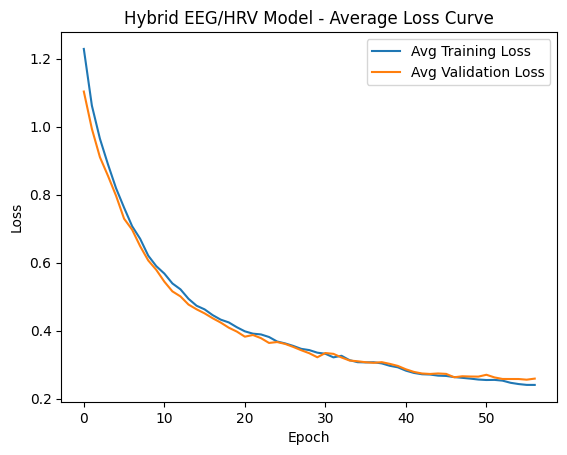

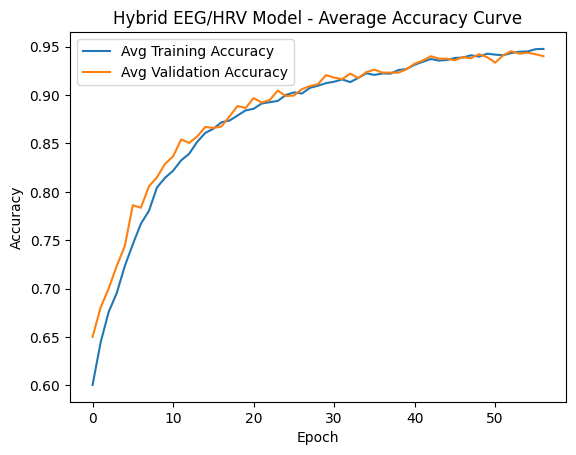

In [301]:
import matplotlib.pyplot as plt

# Plot average loss
plt.figure()
plt.plot(avg_train_loss_hybrid, label='Avg Training Loss')
plt.plot(avg_val_loss_hybrid, label='Avg Validation Loss')
plt.title('Hybrid EEG/HRV Model - Average Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot average accuracy
plt.figure()
plt.plot(avg_train_acc_hybrid, label='Avg Training Accuracy')
plt.plot(avg_val_acc_hybrid, label='Avg Validation Accuracy')
plt.title('Hybrid EEG/HRV Model - Average Accuracy Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

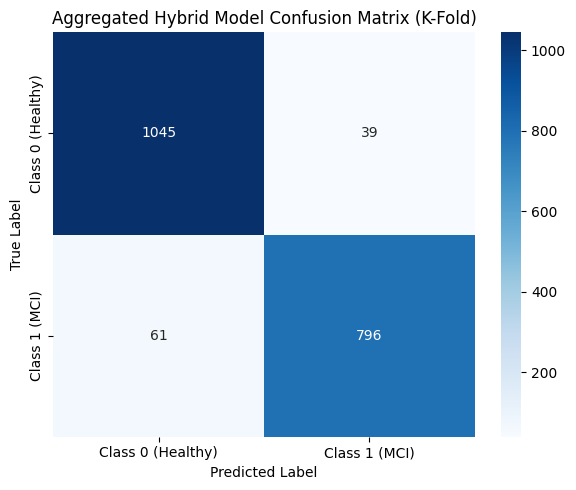

In [298]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Confusion matrix
cm_hybrid = confusion_matrix(all_y_true_hybrid, all_y_pred_hybrid)

# Labels
labels = ['Class 0 (Healthy)', 'Class 1 (MCI)']

# Plot
plt.figure(figsize=(6, 5))
sns.heatmap(cm_hybrid, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Aggregated Hybrid Model Confusion Matrix (K-Fold)')
plt.tight_layout()
plt.show()

### EEG

In [302]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report
from keras.models import Model
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Flatten, Dense, Dropout, BatchNormalization
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Parameters
n_splits = 10
l2_reg = 0.001

# Storage
all_train_acc_eeg, all_val_acc_eeg = [], []
all_train_loss_eeg, all_val_loss_eeg = [], []
all_y_true_eeg, all_y_pred_eeg = [], []

skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
fold_no = 1

for train_idx, test_idx in skf.split(np.zeros(len(Y_train)), Y_train):
    print(f"\n--- Training Fold {fold_no} ---")

    eeg_train = X_train_eeg_transformed[train_idx]
    eeg_test = X_train_eeg_transformed[test_idx]
    y_train_fold = Y_train[train_idx]
    y_test_fold = Y_train[test_idx]

    # Model architecture (same as hybrid's EEG branch)
    input_eeg = Input(shape=(X_train_eeg_transformed.shape[1], 1))
    eeg_branch = Conv1D(filters=32, kernel_size=2, activation='relu', kernel_regularizer=l2(l2_reg))(input_eeg)
    eeg_branch = BatchNormalization()(eeg_branch)
    eeg_branch = MaxPooling1D(pool_size=2)(eeg_branch)
    eeg_branch = Conv1D(filters=32, kernel_size=2, activation='relu', kernel_regularizer=l2(l2_reg))(eeg_branch)
    eeg_branch = MaxPooling1D(pool_size=2)(eeg_branch)
    eeg_branch = LSTM(32, return_sequences=True, dropout=0.1, recurrent_dropout=0.2, kernel_regularizer=l2(l2_reg))(eeg_branch)
    eeg_branch = Flatten()(eeg_branch)
    eeg_branch = Dropout(0.3)(eeg_branch)

    output = Dense(1, activation='sigmoid')(eeg_branch)
    model_eeg_kfold = Model(inputs=input_eeg, outputs=output)

    # Compile
    optimizer = Adam(learning_rate=1e-3, clipvalue=1.0)
    model_eeg_kfold.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5)

    # Train
    history = model_eeg_kfold.fit(
        eeg_train, y_train_fold,
        validation_data=(eeg_test, y_test_fold),
        epochs=100,
        batch_size=36,
        verbose=1,
        callbacks=[early_stopping, lr_scheduler]
    )

    # Store metrics
    all_train_acc_eeg.append(history.history['accuracy'])
    all_val_acc_eeg.append(history.history['val_accuracy'])
    all_train_loss_eeg.append(history.history['loss'])
    all_val_loss_eeg.append(history.history['val_loss'])

    # Predict
    preds = (model_eeg_kfold.predict(eeg_test) > 0.5).astype(int)
    all_y_pred_eeg.extend(preds.flatten())
    all_y_true_eeg.extend(y_test_fold)

    fold_no += 1
    K.clear_session()


--- Training Fold 1 ---
Epoch 1/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.5465 - loss: 0.7688 - val_accuracy: 0.6000 - val_loss: 0.7528 - learning_rate: 0.0010
Epoch 2/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6378 - loss: 0.7200 - val_accuracy: 0.6051 - val_loss: 0.7373 - learning_rate: 0.0010
Epoch 3/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6479 - loss: 0.6931 - val_accuracy: 0.5897 - val_loss: 0.7228 - learning_rate: 0.0010
Epoch 4/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6849 - loss: 0.6626 - val_accuracy: 0.6103 - val_loss: 0.7088 - learning_rate: 0.0010
Epoch 5/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7319 - loss: 0.6308 - val_accuracy: 0.6564 - val_loss: 0.6847 - learning_rate: 0.0010
Epoch 6/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7517 - loss: 0.5910 - val_accuracy: 0.6615 - val_loss: 0.6537 - learning_rate: 0.0010
Epoch 7/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.778

In [305]:
# Compute mean curves
min_len_eeg = min(len(hist) for hist in all_train_acc_eeg)
avg_train_acc_eeg = np.mean([a[:min_len_eeg] for a in all_train_acc_eeg], axis=0)
avg_val_acc_eeg = np.mean([a[:min_len_eeg] for a in all_val_acc_eeg], axis=0)
avg_train_loss_eeg = np.mean([a[:min_len_eeg] for a in all_train_loss_eeg], axis=0)
avg_val_loss_eeg = np.mean([a[:min_len_eeg] for a in all_val_loss_eeg], axis=0)

In [306]:
# Print final summary
print(f"Average Validation Accuracy: {np.mean(avg_train_acc_eeg[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_train_acc_eeg[-10:]) * 100:.2f}%")

print(f"Average Validation Accuracy: {np.mean(avg_val_acc_eeg[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_val_acc_eeg[-10:]) * 100:.2f}%")

Average Validation Accuracy: 90.05%
Standard Validation Accuracy Deviation (last 10 epochs): 0.41%
Average Validation Accuracy: 90.11%
Standard Validation Accuracy Deviation (last 10 epochs): 0.57%


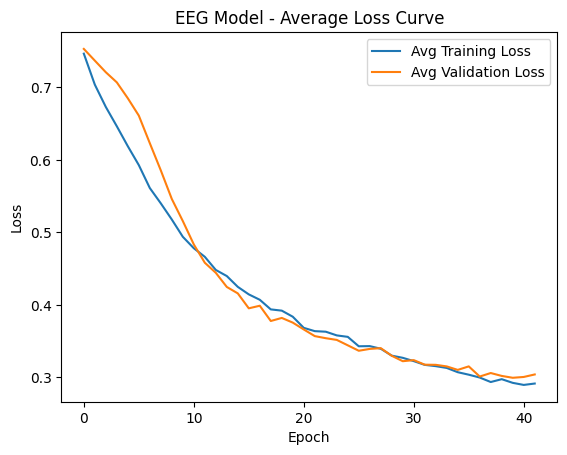

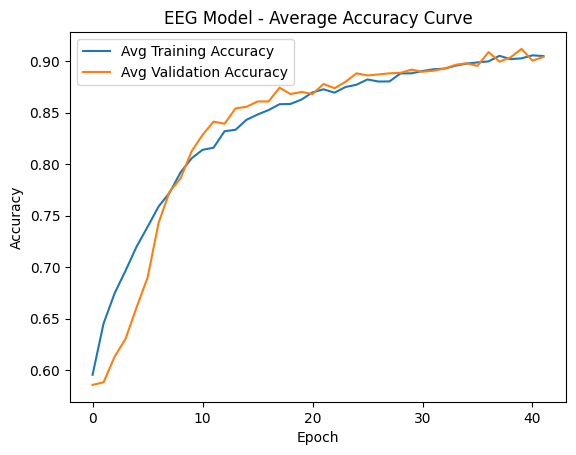

In [307]:
# Plot average loss
plt.figure()
plt.plot(avg_train_loss_eeg, label='Avg Training Loss')
plt.plot(avg_val_loss_eeg, label='Avg Validation Loss')
plt.title('EEG Model - Average Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot average accuracy
plt.figure()
plt.plot(avg_train_acc_eeg, label='Avg Training Accuracy')
plt.plot(avg_val_acc_eeg, label='Avg Validation Accuracy')
plt.title('EEG Model - Average Accuracy Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

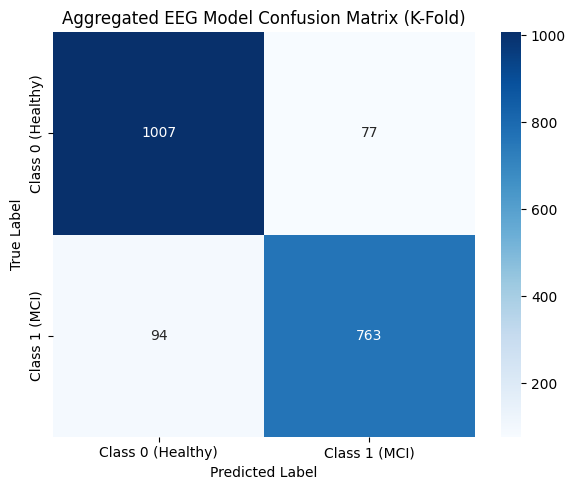

In [304]:
cm_eeg = confusion_matrix(all_y_true_eeg, all_y_pred_eeg)

# Labels
labels = ['Class 0 (Healthy)', 'Class 1 (MCI)']

# Plot
plt.figure(figsize=(6, 5))
sns.heatmap(cm_eeg, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Aggregated EEG Model Confusion Matrix (K-Fold)')
plt.tight_layout()
plt.show()

In [303]:
# Try classification report again
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(all_y_true_eeg, all_y_pred_eeg, target_names=["Healthy", "MCI"]))

              precision    recall  f1-score   support

     Healthy       0.91      0.93      0.92      1084
         MCI       0.91      0.89      0.90       857

    accuracy                           0.91      1941
   macro avg       0.91      0.91      0.91      1941
weighted avg       0.91      0.91      0.91      1941



### HRV

In [308]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report
from keras.layers import Input, Dense, Dropout, LSTM, Flatten
from keras.models import Model
from keras.regularizers import l2
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras import backend as K
import numpy as np

# Parameters
n_splits = 10
l2_reg = 0.001

# Storage
all_train_acc_hrv, all_val_acc_hrv = [], []
all_train_loss_hrv, all_val_loss_hrv = [], []
all_y_true_hrv, all_y_pred_hrv = [], []

skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
fold_no = 1

for train, test in skf.split(np.zeros(len(Y_train)), Y_train):
    print('------------------------------------------------------------------------')
    print(f'Training for fold {fold_no} ...')

    # Fold data
    X_hrv_train, X_hrv_val = X_train_hrv_reshaped[train], X_train_hrv_reshaped[test]
    y_train_fold, y_test_fold = Y_train[train], Y_train[test]

    # Model architecture
    input_hrv = Input(shape=(1, X_train_hrv_reshaped.shape[2]))
    hrv_branch = LSTM(32, dropout=0.1, recurrent_dropout=0.2, kernel_regularizer=l2(l2_reg))(input_hrv)
    hrv_branch = Dense(64, activation='relu', kernel_regularizer=l2(l2_reg))(hrv_branch)
    hrv_branch = Dropout(0.1)(hrv_branch)
    output = Dense(1, activation='sigmoid')(hrv_branch)

    model_hrv_kfold = Model(inputs=input_hrv, outputs=output)
    model_hrv_kfold.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

    # Callbacks
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10)
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Fit
    history = model_hrv_kfold.fit(
        X_hrv_train, y_train_fold,
        batch_size=36,
        epochs=100,
        verbose=1,
        validation_data=(X_hrv_val, y_test_fold),
        callbacks=[early_stopping, lr_scheduler]
    )

    # Store metrics
    all_train_acc_hrv.append(history.history['accuracy'])
    all_val_acc_hrv.append(history.history['val_accuracy'])
    all_train_loss_hrv.append(history.history['loss'])
    all_val_loss_hrv.append(history.history['val_loss'])

    # Predictions
    preds = (model_hrv_kfold.predict(X_hrv_val) > 0.5).astype(int)
    all_y_pred_hrv.extend(preds.flatten())
    all_y_true_hrv.extend(y_test_fold)

    fold_no += 1
    K.clear_session()

------------------------------------------------------------------------
Training for fold 1 ...
Epoch 1/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5933 - loss: 0.7413 - val_accuracy: 0.6051 - val_loss: 0.7087 - learning_rate: 0.0010
Epoch 2/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6197 - loss: 0.7083 - val_accuracy: 0.6154 - val_loss: 0.6882 - learning_rate: 0.0010
Epoch 3/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6017 - loss: 0.6942 - val_accuracy: 0.6564 - val_loss: 0.6743 - learning_rate: 0.0010
Epoch 4/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6481 - loss: 0.6704 - val_accuracy: 0.6564 - val_loss: 0.6666 - learning_rate: 0.0010
Epoch 5/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6477 - loss: 0.6589 - val_accuracy: 0.6564 - val_loss: 0.6609 - learning_rate: 0.0010
Epoch 6/100
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6025 - loss: 0.6713 - val_accuracy: 0.6462 - val_loss: 0.6569 - learning_rate: 0.0

In [311]:
# Compute mean curves
min_len_hrv = min(len(hist) for hist in all_train_acc_hrv)
avg_train_acc_hrv = np.mean([a[:min_len_hrv] for a in all_train_acc_hrv], axis=0)
avg_val_acc_hrv = np.mean([a[:min_len_hrv] for a in all_val_acc_hrv], axis=0)
avg_train_loss_hrv = np.mean([a[:min_len_hrv] for a in all_train_loss_hrv], axis=0)
avg_val_loss_hrv = np.mean([a[:min_len_hrv] for a in all_val_loss_hrv], axis=0)

In [312]:
# Print final summary
print(f"Average Training Accuracy: {np.mean(avg_train_acc_hrv[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_train_acc_hrv[-10:]) * 100:.2f}%")

print(f"Average Training Accuracy: {np.mean(avg_val_acc_hrv[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_val_acc_hrv[-10:]) * 100:.2f}%")

Average Training Accuracy: 65.77%
Standard Validation Accuracy Deviation (last 10 epochs): 0.20%
Average Training Accuracy: 65.67%
Standard Validation Accuracy Deviation (last 10 epochs): 0.48%


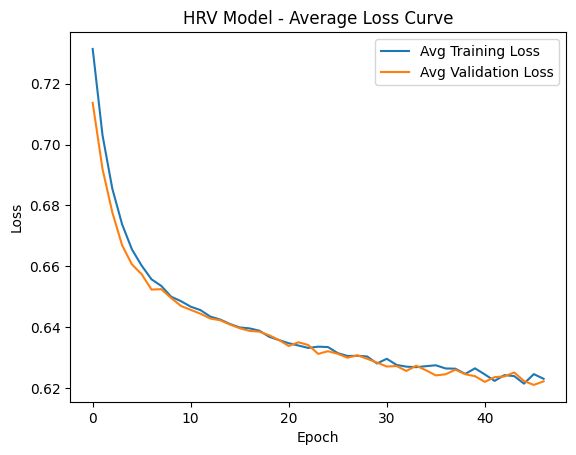

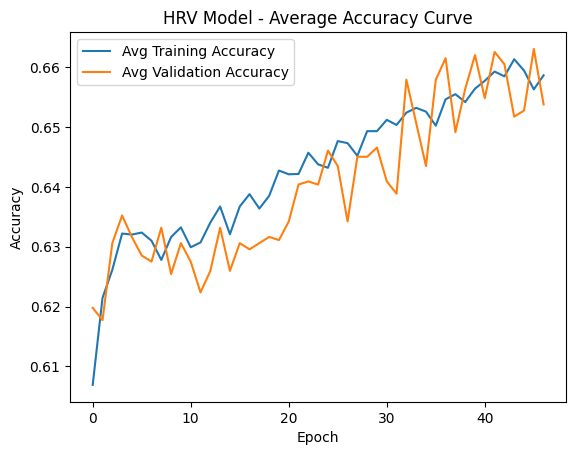

In [313]:
# Plot average loss
plt.figure()
plt.plot(avg_train_loss_hrv, label='Avg Training Loss')
plt.plot(avg_val_loss_hrv, label='Avg Validation Loss')
plt.title('HRV Model - Average Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot average accuracy
plt.figure()
plt.plot(avg_train_acc_hrv, label='Avg Training Accuracy')
plt.plot(avg_val_acc_hrv, label='Avg Validation Accuracy')
plt.title('HRV Model - Average Accuracy Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

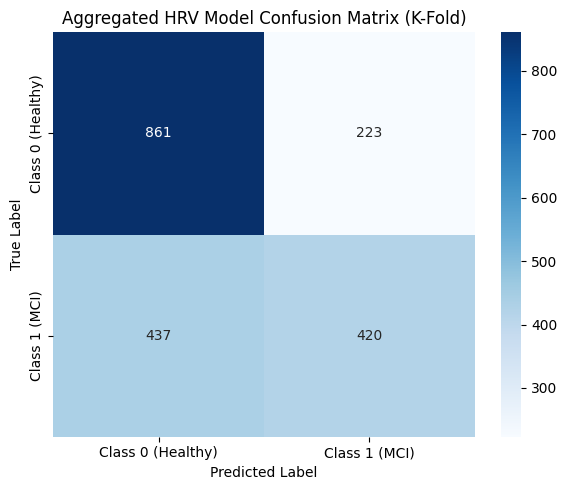

In [310]:
cm_hrv = confusion_matrix(all_y_true_hrv, all_y_pred_hrv)

# Labels
labels = ['Class 0 (Healthy)', 'Class 1 (MCI)']

# Plot
plt.figure(figsize=(6, 5))
sns.heatmap(cm_hrv, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Aggregated HRV Model Confusion Matrix (K-Fold)')
plt.tight_layout()
plt.show()

In [309]:
# Try classification report again
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(all_y_true_hrv, all_y_pred_hrv, target_names=["Healthy", "MCI"]))

              precision    recall  f1-score   support

     Healthy       0.66      0.79      0.72      1084
         MCI       0.65      0.49      0.56       857

    accuracy                           0.66      1941
   macro avg       0.66      0.64      0.64      1941
weighted avg       0.66      0.66      0.65      1941

